# <center> <b> AIRBNB: ROMA  </b> </center>
<P align="right"> IGNACIO TORRALBA RUIZ

# Introducción

Inside Airbnb es un sitio web que proporciona análisis de datos sobre el uso de Airbnb en diferentes ciudades alrededor del mundo. El sitio web presenta información sobre el número de anuncios, el precio promedio de los alquileres, la duración de la estadía promedio y otros datos relacionados con el uso de la plataforma Airbnb. Inside Airbnb es un proyecto independiente que no está afiliado con Airbnb.

Roma es la capital de Italia y una de las ciudades más antiguas del mundo, con una historia que se extiende más de 2.500 años. Fue fundada en el año 753 a.C. y se convirtió en el centro del Imperio Romano, uno de los imperios más poderosos de la historia. La ciudad es rica en historia, arquitectura y arte, con famosos lugares como el Coliseo, el Foro Romano y la Fontana di Trevi. También es el hogar de la Iglesia Católica y el Papa. Roma es un destino turístico popular y es conocida por su comida, moda y cultura.


<br>
<center><img src="https://viajes.nationalgeographic.com.es/medio/2019/03/24/roma-tiber_4d916354_1280x720.jpg" width="1000" height="700"></center>
<br>
<center> Imagen National Geografhic viajes </center>

# 1. Importando módulos y datos

## 1.1 Importar módulos

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
sns.set()
import matplotlib.pyplot as plt
import plotly.express as px
import wget
import os
import json
from datetime import datetime
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# mapas interactivos
import folium
from folium.plugins import FastMarkerCluster
import geopandas as gpd
from branca.colormap import LinearColormap

#to make the plotly graphs
import plotly.graph_objs as go
#import chart_studio.plotly as py
from plotly.offline import iplot, init_notebook_mode
import cufflinks
cufflinks.go_offline(connected=True)
init_notebook_mode(connected=True)
from plotly.subplots import make_subplots
import cufflinks as cf

#text mining
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
#import re
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from wordcloud import WordCloud
from colorspacious import cspace_converter
from  matplotlib.colors import LinearSegmentedColormap

## 1.2 - Descarga y lectura de documentos
Descargamos los docuementos necesarios de la ciudad de Roma. Y procedemos a leerlos para poder utilizarlos más adelante.

En caso de querer acceder a los documentos: [Insideairbnb](http://insideairbnb.com/get-the-data/)

In [3]:
wget.download("http://data.insideairbnb.com/italy/lazio/rome/2022-09-11/data/listings.csv.gz")
wget.download("http://data.insideairbnb.com/italy/lazio/rome/2022-09-11/data/calendar.csv.gz")
wget.download("http://data.insideairbnb.com/italy/lazio/rome/2022-09-11/data/reviews.csv.gz")
wget.download("http://data.insideairbnb.com/italy/lazio/rome/2022-09-11/visualisations/neighbourhoods.csv")
wget.download("http://data.insideairbnb.com/italy/lazio/rome/2022-09-11/visualisations/neighbourhoods.geojson")

'neighbourhoods (1).csv'

In [2]:
listings_details = pd.read_csv('listings.csv.gz', compression ='gzip')
calendar = pd.read_csv('calendar.csv.gz', compression ='gzip')
reviews = pd.read_csv('reviews.csv.gz', compression ='gzip')
listings = pd.read_csv('listings_short.csv')

## 1.3 Detalles del listado de viviendas

El conjunto de datos contiene un total de 5 archivos. El archivo de listados es un archivo de descripción general que las etiquetas internas de airbnb como "bueno para visualizaciones". El identificador único en el conjunto de datos es la identificación de "listings". Esta es básicamente la identificación del anuncio. En general, había 24782 listados de Airbnb en Roma el 11 September de 2022.

In [28]:
print(os.listdir("input"))

['calendar.csv', 'listings_details.csv', 'neighbourhoods.csv', 'neighbourhoods.geojson', 'reviews_details.csv']


In [25]:
print(listings.shape)

(24782, 18)


El archivo de listados contiene 18 variables por listado además del id.

In [3]:
listings.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'number_of_reviews_ltm', 'license'],
      dtype='object')

El archivo listados_detalles contiene un total de 74 variables. No vamos a usar todos estos, sino que juntaremos selectivamente una serie de variables que parecen útiles para este EDA.

In [32]:
listings_details.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name',
       'description', 'neighborhood_overview', 'picture_url', 'host_id',
       'host_url', 'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'ca

In [3]:
target_columns = ["property_type",'neighbourhood_cleansed', "accommodates", "first_review", "review_scores_value", "review_scores_cleanliness", "review_scores_location", "review_scores_accuracy", "review_scores_communication", "review_scores_checkin", "reviews_per_month", "review_scores_rating", "maximum_nights", "listing_url", "host_is_superhost", "host_about", "host_response_time", "host_response_rate", "host_listings_count"]
listings = pd.merge(listings, listings_details[target_columns],left_index=True, right_index=True)
listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24782 entries, 0 to 24781
Data columns (total 37 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              24782 non-null  int64  
 1   name                            24779 non-null  object 
 2   host_id                         24782 non-null  int64  
 3   host_name                       24776 non-null  object 
 4   neighbourhood_group             0 non-null      float64
 5   neighbourhood                   24782 non-null  object 
 6   latitude                        24782 non-null  float64
 7   longitude                       24782 non-null  float64
 8   room_type                       24782 non-null  object 
 9   price                           24782 non-null  int64  
 10  minimum_nights                  24782 non-null  int64  
 11  number_of_reviews               24782 non-null  int64  
 12  last_review                     

Podemos apreciar que las columnas neighbourhood_group y license, tienen demasiados valores nulos como para poder se utilizados en el analisis. Procedemos a la eliminación de dichas variables.

In [4]:
listings = listings.drop(columns=['neighbourhood_group'])
listings = listings.drop(columns=['license'])

In [6]:
listings.head()

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,...,review_scores_checkin,reviews_per_month_y,review_scores_rating,maximum_nights,listing_url,host_is_superhost,host_about,host_response_time,host_response_rate,host_listings_count
0,103870,CASACHICA Your holiday home in Rome,535822,Fabrizio,I Centro Storico,41.89711,12.50423,Entire home/apt,78,3,...,4.85,3.22,4.74,3,https://www.airbnb.com/rooms/17629440,t,Mi piace viaggiare sono molto ospitale e ho vi...,within a few hours,100%,2.0
1,17629440,ISOLA DEL CUORE,68534156,Cristina,VII San Giovanni/Cinecittà,41.78984,12.60899,Private room,45,1,...,4.80,0.07,4.80,1125,https://www.airbnb.com/rooms/2737,f,I am a Turkish-Italian who was born in Istanbu...,within a few hours,99%,7.0
2,2737,"Elif's room in cozy, clean flat.",3047,Elif,VIII Appia Antica,41.87136,12.48215,Private room,50,7,...,4.65,1.64,4.11,60,https://www.airbnb.com/rooms/103870,f,"Sportivo, amante dell'arte e della mia città. ...",within an hour,100%,1.0
3,2903,Stay a night in Calisto6 B&B Rome,3280,Andrea,I Centro Storico,41.88824,12.46953,Private room,164,1,...,4.59,0.33,4.28,730,https://www.airbnb.com/rooms/2903,f,NaN,within a day,56%,3.0
4,3079,Cozy apartment (2-4)with Colisseum view,3504,Laura,I Centro Storico,41.89500,12.49117,Entire home/apt,90,3,...,4.83,0.05,5.00,1125,https://www.airbnb.com/rooms/104339,f,"Ciao\r\nsono Giuseppe, amo viaggare e conoscer...",NaN,NaN,3.0


# 2. Análisis exploratorio
## 2.1 Municipios
En la actualidad, la República Italiana esta dividida en 20 regiones que agrupan la totalidad del territorio soberano italiano. La ciudad de Roma esta hubicada en la región de Lacio en la parte central de la peninsula italiana. La región de Lacio a la vez se subdivide en 5 provincias. Para la realización de este estudio se trabajará con el territorio de la ciudad de Roma dentro de la provincia de Roma.

<br>
<center><img src="https://es-academic.com/pictures/eswiki/76/Latium_Provinces.png" width="600" height="500"></center>
<br>
Para más información sobre la organización territorial de Italia consultar: 
<a href="https://es.wikipedia.org/wiki/Italia#Organizaci%C3%B3n_territorial">Wikipedia</a><br />


<br>
<center><img src="https://upload.wikimedia.org/wikipedia/commons/8/8a/Roma_municipi_locator_map_with_numbers.svg" width="600" height="500"></center>
<br>
Roma estaba dividida en 19 municipios pero en 2013 se conviertieron en 15 y sigue igual en la actualidad.

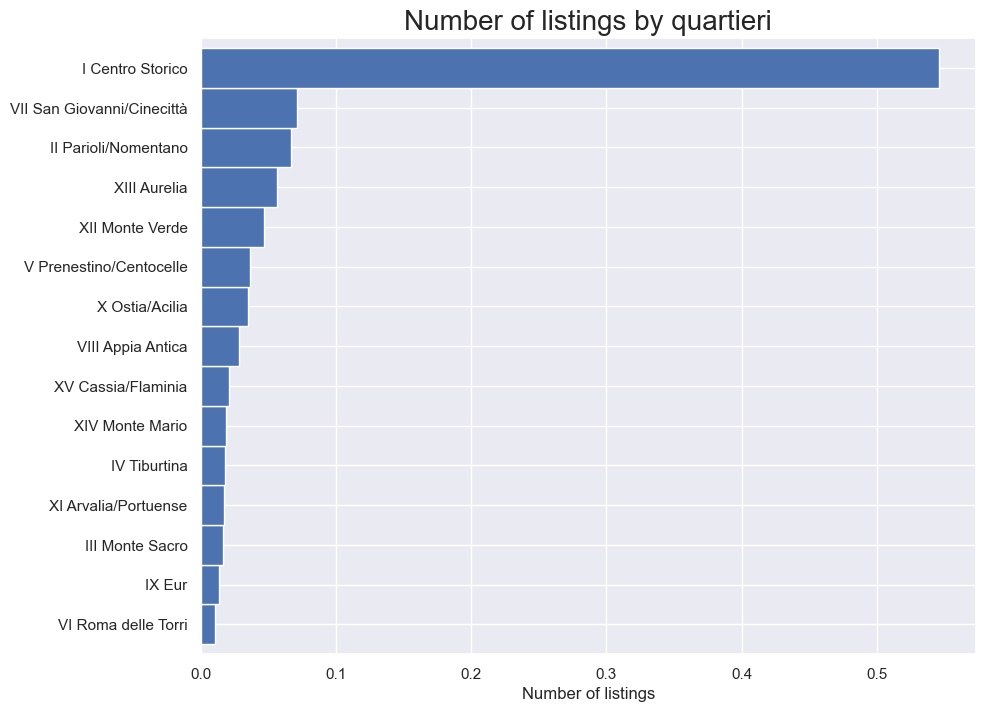

In [77]:
feq=listings['neighbourhood_cleansed'].value_counts(15).sort_values(ascending=True)
feq.plot.barh(figsize=(10, 8), color='b', width=1)
plt.title("Number of listings by quartieri", fontsize=20)
plt.xlabel('Number of listings', fontsize=12)
plt.show()

In [33]:
lats2022 = listings['latitude'].tolist()
lons2022 = listings['longitude'].tolist()
locations = list(zip(lats2022, lons2022))

map1 = folium.Map(location=[41.89193, 12.51133], zoom_start=11.5)
FastMarkerCluster(data=locations).add_to(map1)
map1

A continuación, se puede ver que la mayoría de los ubicaciones están en el centro de la ciudad y alrededores de la ciudad, a excepción de Lido di Ostia donde tambien hay una concentración de cierta importancia respecto a otras zonas. Este mapa es interactivo y puede ampliar los grupos para encontrar las ubicaciones individuales de los listados.


## 2.2 Tipos de propiedades y habitaciones

### 2.2.1 Tipos de habitaciones

El tipo de habitación es muy importante en Roma, esto es debido a que en Roma solo se pueden alquilar a través de Airbnb por un máximo de 30 días al año.

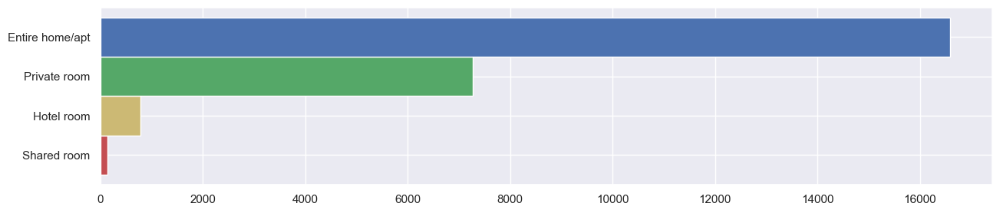

In [101]:
freq = listings['room_type']. value_counts().sort_values(ascending=True)
freq.plot.barh(figsize=(15, 3), width=1, color = ["r","y","g", "b"])
plt.show()

NOTA: En el caso de Roma se puede apreciar que la norma de 30 días al año se tiene que aplicar a la mayoría de los listados.

### 2.2.2 Tipos de propiedades

En el conjunto de datos, encontramos muchos tipos de propiedades diferentes. Esto es debido a la popularidad de la ciudad para el Turismo y la gran diferencia de ambiente que hay en los datos, desde el centro de Roma hasta en pueblos a 30km de Roma.

In [102]:
listings.property_type.unique()

array(['Private room in rental unit', 'Private room',
       'Entire rental unit', 'Private room in bed and breakfast',
       'Entire condo', 'Private room in guesthouse', 'Entire loft',
       'Private room in condo', 'Entire villa',
       'Room in bed and breakfast', 'Entire guesthouse',
       'Private room in home', 'Private room in villa', 'Entire cottage',
       'Private room in loft', 'Room in boutique hotel', 'Farm stay',
       'Entire home', 'Private room in serviced apartment',
       'Private room in guest suite', 'Entire guest suite',
       'Private room in casa particular', 'Entire vacation home',
       'Room in serviced apartment', 'Shared room in rental unit',
       'Private room in boat', 'Tiny home',
       'Private room in vacation home', 'Entire cabin',
       'Private room in nature lodge', 'Shared room in hostel',
       'Private room in farm stay', 'Entire bungalow',
       'Private room in tiny home', 'Entire place', 'Room in hotel',
       'Entire service

Sin embargo, muchos de esos tipos de propiedades tienen muy pocos listados en Roma. En la figura a continuación, solo mostramos tipos de propiedades con al menos 100 listados. Como podemos ver, la gran mayoría de las propiedades en Roma son las unidades de alquiler completo.

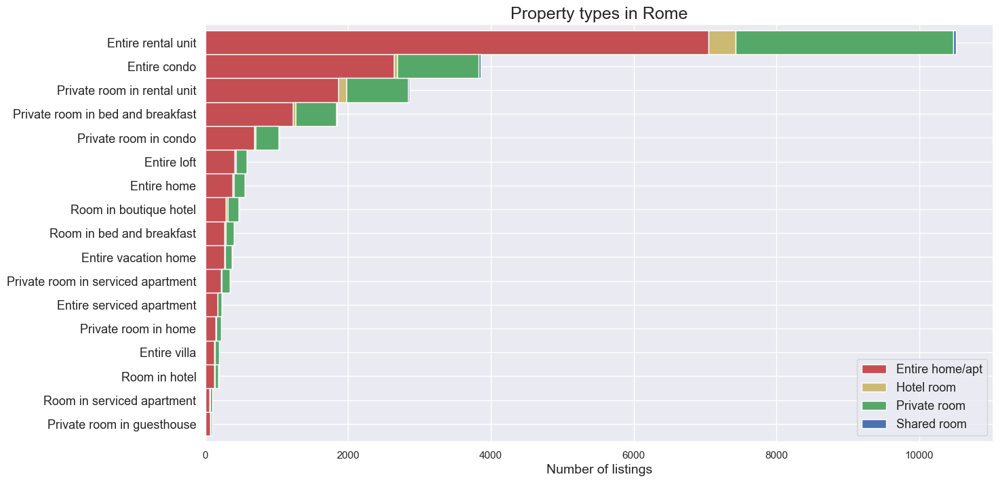

In [105]:
prop = listings.groupby(['property_type','room_type']).room_type.count()
prop = prop.unstack()
prop['total'] = prop.iloc[:,0:3].sum(axis = 1)
prop = prop.sort_values(by=['total'])
prop = prop[prop['total']>=100]
prop = prop.drop(columns=['total'])

prop.plot(kind='barh',stacked=True, color = ["r","y","g", "b"],
              linewidth = 1, grid=True, figsize=(15,8), width=1)
plt.title('Property types in Rome', fontsize=18)
plt.xlabel('Number of listings', fontsize=14)
plt.ylabel("")
plt.legend(loc = 4,prop = {"size" : 13})
plt.rc('ytick', labelsize=13)
plt.show()

## 2.3 Número de alojados

Se puede apreciar que la mayoría de los listados son para 2 personas y seguido por 4 personas. Además, Airbnb utiliza un máximo de 16 huéspedes por anuncio.

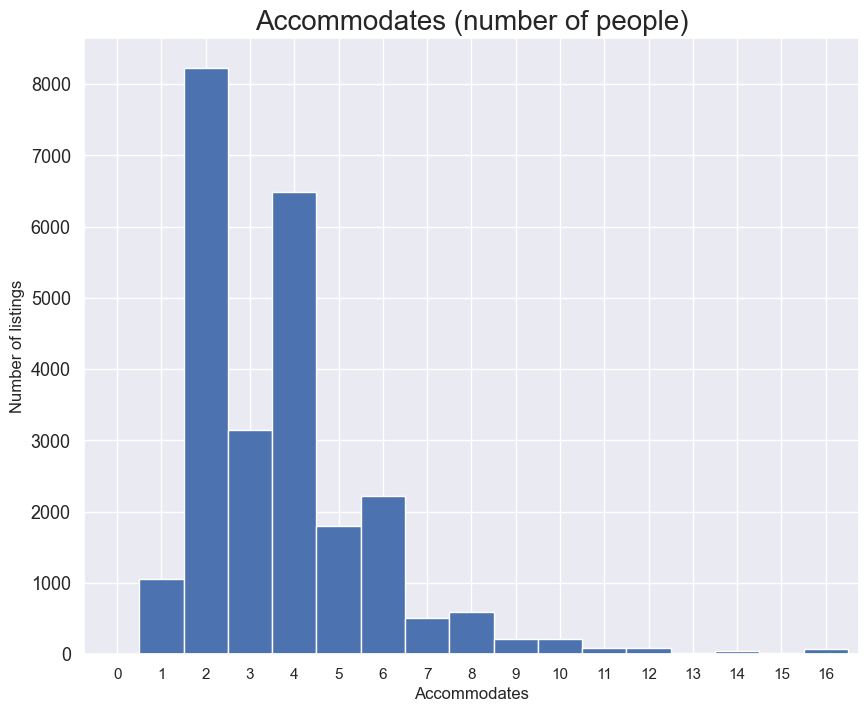

In [110]:
feq=listings['accommodates'].value_counts().sort_index()
feq.plot.bar(figsize=(10, 8), color='b', width=1, rot=0)
plt.title("Accommodates (number of people)", fontsize=20)
plt.ylabel('Number of listings', fontsize=12)
plt.xlabel('Accommodates', fontsize=12)
plt.show()

Debido a la procedencia de los datos no se puede tener en cuenta las normas de grupos con un máximo de personas, esto se debe a que no se pueden aplicar el mismo reglamento en un piso en en centro de Roma y una casa de pueblo en Ostia.

Además, se puede observar que no hay datos de grupos superiores a 16 personas, lo que descarta que haya un inclumiento del número máximo de huéspedes por anuncio de Airbnb.

# 3. Analítica al servicio del gobierno

Se conoce en la actualidad que los pisos turisticos producen problemas en las ciudades, con un incremento del precio del alquiler para la gente que vive en la ciudad y que muchas viviendas se convierten en hoteles que no cumplen con las leyes de la ciudad. Roma es una ciudad que sufre los mismos problemas que el resto de ciudades, por eso se han creado unas reglas ha cumplir.


Las reglas adicionales que tiene Roma en comparación con las propias reglas de Airbnb son:

* Impuesto por pernoctación de entre 3-7 € por noche
*El número máximo para el alquiler a corto plazo es de 30 días por año calendario. Esta regla es solo para el alquiler de propiedades completas y, por lo tanto, no se aplica al alquiler de habitaciones privadas.
* Rome tiene la intención de prohibir Airbnb por completo en zonas centricas de Roma y zonas cercanas a monumentos.
* Para el alquiler de Habitaciones Privadas, también existe la restricción de que un propietario no puede alquilar habitaciones que acumulen más del 40% de la superficie total (en metros cuadrados)
* Roma exige que los anfitriones proporcionen datos personales sobre los huéspedes a las autoridades de seguridad pública.

## 3.1 Encontrando potenciales hoteles ilegales

Cualquier propietario que alquile más del 40% de su propiedad como Habitaciones Privadas está incumpliendo la última regla mencionada en la sección anterior, pero en esta sección solo voy a buscar casos extremos.

A continuación, mostramos los cinco anfitriones que tienen la mayor cantidad de listas de salas privadas. Se puede apreciar que todos estan situados en el centro historico de Roma.

In [112]:
private = listings[listings['room_type'] == "Private room"]
host_private = private.groupby(['host_id', 'host_name', 'neighbourhood_cleansed']).size().reset_index(name='private_rooms').sort_values(by=['private_rooms'], ascending=False)
host_private.head()

,host_id,host_name,neighbourhood_cleansed,private_rooms
4050,230950667,Ancient Rome,I Centro Storico,19
2980,97409859,Magenta,I Centro Storico,17
3279,128751678,Fabjol,I Centro Storico,14
842,8973851,Stefano,I Centro Storico,13
3038,103306448,Hunan,I Centro Storico,12


El primer caso con el nombre Acient Roma, parece que se trata de un hotel o algun sistema del mismo tipo. Utilizando los datos de latitud/longitud se puede apreciar que están en la misma zona. Aunque este anfitrión podría tener una licencia de hotel. Sería aconsejable asegurarse de que municipio de que compruebe si no se infringen las normas en este caso. <a href="https://ancientromeapartment.business.site/?utm_source=gmb&utm_medium=referral/">Acient Roma</a><br />

In [114]:
acient_roma = private[private['host_id']== 230950667]
acient_roma = acient_roma[['name','host_id', 'host_name', 'latitude', 'longitude', 'room_type']]
acient_roma.index.name = "listing_id"
acient_roma

,name,host_id,host_name,latitude,longitude,room_type
listing_id,,,,,,
12355,Magenta Luxury Fico 4,230950667,Ancient Rome,41.899544,12.470281,Private room
12357,Magenta Luxury Fico 5,230950667,Ancient Rome,41.899544,12.470281,Private room
12363,Magenta Luxury Fico 6,230950667,Ancient Rome,41.899544,12.470281,Private room
12523,Magenta Luxury Fico 2,230950667,Ancient Rome,41.899540,12.470280,Private room
12537,Magenta Luxury Fico 1,230950667,Ancient Rome,41.900310,12.469090,Private room
12543,Magenta Luxury Fico 3,230950667,Ancient Rome,41.899544,12.470281,Private room
17426,Magenta Superior Purificazione 69/1,230950667,Ancient Rome,41.904850,12.487260,Private room
17461,Magenta Superior Purificazione 69/2,230950667,Ancient Rome,41.904850,12.487260,Private room
17462,Magenta Superior Purificazione 69/3,230950667,Ancient Rome,41.904850,12.487260,Private room


## 3.2 Viviendas Turisticas cerca de monumentos

Como se ha mencionado anteriormente, se está planteando ilegalizar las viviendas turisticas que esten cerca de monumentos. Esto se podría deber al deterioro de los monumentos y el espacio cercano debido al gran afluente de turistas.

Abajo se demuestra un ejemplo de como serían las zonas de exclusion cercanas con los monumentos (algunos monumentos y no todos) y las viviendas que se encontrian en dicha área y se verían afectadas por esta norma.

In [176]:
lats_centre = listings[listings['neighbourhood'] == 'I Centro Storico']['latitude']
lons_centre = listings[listings['neighbourhood'] == 'I Centro Storico']['longitude']
locations = list(zip(lats_centre, lons_centre))
m1 = folium.Map(location=[41.89193, 12.51133], zoom_start=11.5)
for i in range(len(locations)):
    folium.CircleMarker(location=locations[i],radius=1).add_to(m1)
folium.CircleMarker(location=[41.889722, 12.490833],radius=30, color= '#E16C5A').add_to(m1)
folium.CircleMarker(location=[41.890261, 12.493087],radius=30, color= '#E16C5A').add_to(m1)
folium.CircleMarker(location=[41.8929, 12.4719],radius=30, color= '#E16C5A').add_to(m1)
folium.CircleMarker(location=[41.91334, 12.48339],radius=30, color= '#E16C5A').add_to(m1)
folium.CircleMarker(location=[41.88722, 12.50694],radius=30, color= '#E16C5A').add_to(m1)
folium.CircleMarker(location=[41.8907, 12.4855],radius=30, color= '#E16C5A').add_to(m1)
folium.CircleMarker(location=[41.903111, 12.496368],radius=30, color= '#E16C5A').add_to(m1)
folium.CircleMarker(location=[41.8902, 12.4923],radius=30, color= '#E16C5A').add_to(m1)
folium.CircleMarker(location=[41.902916, 12.453389],radius=30, color= '#E16C5A').add_to(m1)
folium.CircleMarker(location=[41.9009, 12.4833],radius=30, color= '#E16C5A').add_to(m1)
folium.CircleMarker(location=[41.898573, 12.476822],radius=30, color= '#E16C5A').add_to(m1)
m1

## 3.3 Efectos no deseados de los anfitriones profesionales

En la actualidad, Roma no tiene reglas vigentes en contra de las actividades de alojamiento profesional.La gran mayoría de los anfitriones solo tienen un listado.Sin embargo, se entiende que habrá casos de un afintrión gestionando a otros afintriones, ya sea por amistades o familiares. También está presente el caso de algunos anfitriones tienen los servicios subcontratados. No obstante, se pueden ver casos extremos donde parece poco probable que los anfitriones con más de 10 listados solo hagan esto para ellos y sus amigos y familiares.

In [9]:
freq = listings.groupby(['host_id']).size().reset_index(name='num_host_listings')
host_prop = freq.groupby(['num_host_listings']).size().reset_index(name='count').transpose()
host_prop.columns = host_prop.iloc[0]
host_prop = host_prop.drop(host_prop.index[0])
host_prop

num_host_listings,1,2,3,4,5,6,7,8,9,10,...,38,41,43,44,52,58,65,100,141,209
count,8887,1733,905,532,263,160,120,66,54,34,...,1,1,2,1,1,1,1,1,1,1


In [67]:
listings_details['host_id'].value_counts()

23532561     209
96122546     141
201739458    100
63191555      65
8973851       58
            ... 
142037874      1
145112817      1
143663530      1
143666593      1
211821938      1
Name: host_id, Length: 12907, dtype: int64

In [68]:
listings[listings['host_id'] == 23532561]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,...,review_scores_checkin,reviews_per_month_y,review_scores_rating,maximum_nights,listing_url,host_is_superhost,host_about,host_response_time,host_response_rate,host_listings_count
2577,4539118,iFlat | Monti secret Garden,23532561,IFlat,I Centro Storico,41.894180,12.489700,Entire home/apt,885,2,...,4.96,2.71,4.94,30,https://www.airbnb.com/rooms/4854822,t,Ciao community!! I'm an International Relation...,within an hour,100%,1.0
2680,4870901,iFlat | Spanish Steps Studio Apartment,23532561,IFlat,I Centro Storico,41.903940,12.490220,Entire home/apt,877,2,...,5.00,0.04,5.00,1125,https://www.airbnb.com/rooms/4606734,f,NaN,NaN,NaN,1.0
2732,5088457,iFlat | Via Giulia Charming Apartment,23532561,IFlat,I Centro Storico,41.898790,12.465140,Entire home/apt,175,2,...,4.78,1.48,4.61,365,https://www.airbnb.com/rooms/4902848,f,Hi my name is Jerome.\nIt's my honor to be you...,within a few hours,67%,4.0
2962,5657500,Pantheon Cozy Apartment n. 3,23532561,IFlat,I Centro Storico,41.900890,12.475980,Entire home/apt,952,3,...,NaN,NaN,NaN,1125,https://www.airbnb.com/rooms/5504913,f,NaN,NaN,NaN,1.0
2963,5657827,Pantheon Cozy Apartment n. 2,23532561,IFlat,I Centro Storico,41.900890,12.475980,Entire home/apt,129,3,...,4.95,0.23,4.85,1125,https://www.airbnb.com/rooms/5351119,t,NaN,within an hour,100%,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23705,688924601269814909,iFlat | Cozy Apartment near Saint Peter n° 2,23532561,IFlat,I Centro Storico,41.909166,12.466085,Entire home/apt,143,1,...,5.00,2.00,5.00,365,https://www.airbnb.com/rooms/692663135953493076,t,"Hello, my name is Ekaterina, I am 33 years old...",within an hour,100%,13.0
23711,686733925306699704,iFlat | Luxury Navona Apartment,23532561,IFlat,I Centro Storico,41.899148,12.471855,Entire home/apt,198,1,...,4.67,5.14,3.83,29,https://www.airbnb.com/rooms/684739931663229954,f,"I like football, I like to make friends all ov...",within an hour,100%,6.0
23722,686845086088756635,iFlat | Synagogue at Your Feet,23532561,IFlat,I Centro Storico,41.892303,12.477977,Entire home/apt,293,1,...,NaN,NaN,NaN,21,https://www.airbnb.com/rooms/685187655318217894,f,NaN,within an hour,100%,2.0
23726,689009005170290099,iFlat | Circo Massimo Infinity View,23532561,IFlat,I Centro Storico,41.883465,12.487290,Entire home/apt,360,1,...,NaN,NaN,NaN,365,https://www.airbnb.com/rooms/693270515599634292,f,NaN,within a few hours,100%,3.0


In [75]:
listings[listings['host_name'] == 'IFlat']['host_about']

2577     Ciao community!! I'm an International Relation...
2680                                                   NaN
2732     Hi my name is Jerome.\nIt's my honor to be you...
2962                                                   NaN
2963                                                   NaN
                               ...                        
23705    Hello, my name is Ekaterina, I am 33 years old...
23711    I like football, I like to make friends all ov...
23722                                                  NaN
23726                                                  NaN
23889                                                  NaN
Name: host_about, Length: 212, dtype: object

Los datos demuestran que el host con nombre IFlat tiene 209 opciones disponibles. Sin embargo, al comprobar host_abaout donde los dueños dejan mensajes se oberva que hay dueños llamados Jerome, Ekaterina, etc. Todo esto nos da la impresión de que los dueños tienen subcontratado a una entidad que se ocupa de la gestión. Por lo tanto, la entidad encarda es:  <a href="https://www.iflat.it/">IFlat</a><br />



# 4. Consejos al turismo

## 4.1 Precio medio por municipio

### 4.1.1 Precio medio por municipio / 2 personas

A la hora de estudiar el precio medio por municipio, se tiene que entender que el precio en el mismo municipio será muy diferente si es para dos persona o para 6 personas. Debido a esto vamos a acotar este problema, filtrando por el tipo de alojamiento más común que es alojamiento para 2 personas. Como hemos podido ver en el apartado anterior 2.3 Número de alojados.

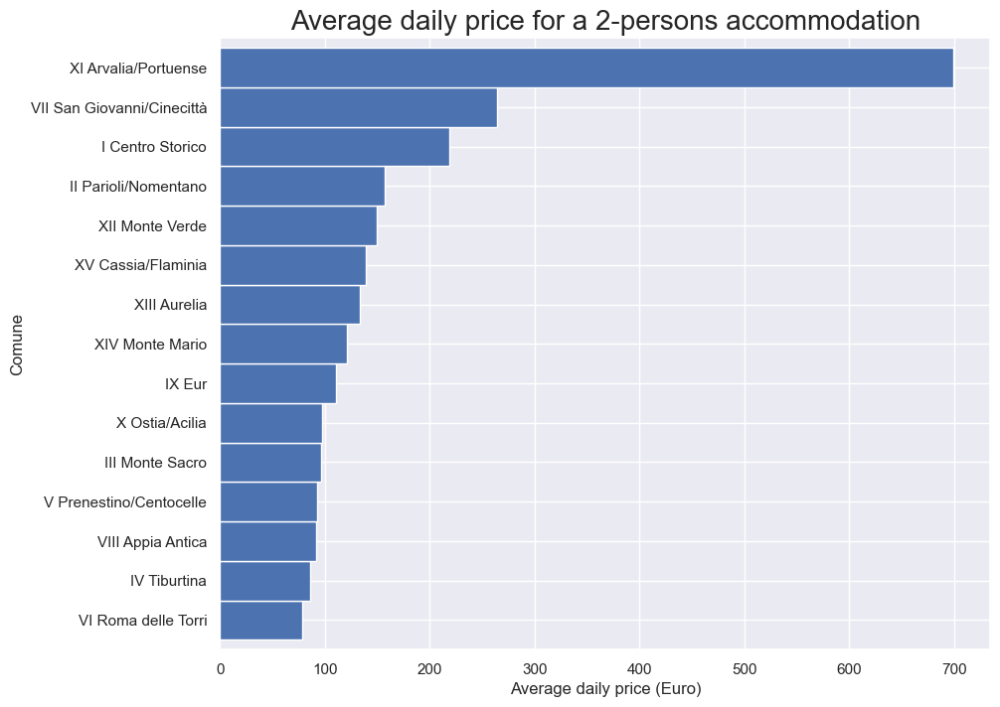

In [94]:
feq1 = listings[listings['accommodates']==2]
feq1 = feq1.groupby('neighbourhood')['price'].mean().sort_values(ascending=True)
feq1.plot.barh(figsize=(10, 8), color='b', width=1)
plt.title("Average daily price for a 2-persons accommodation", fontsize=20)
plt.xlabel('Average daily price (Euro)', fontsize=12)
plt.ylabel("Comune")
plt.show()

A continuación puede encontrar los barrios en un mapa. Este mapa es **interactivo**. Al pasar el cursor sobre los polígonos se muestra el nombre del municipio y el precio medio de los alojamientos para 2 personas.

In [97]:
adam1 = gpd.read_file("neighbourhoods.geojson")
feq1 = pd.DataFrame([feq1])
feq1 = feq.transpose()
adam1 = pd.merge(adam1, feq1, on='neighbourhood', how='left')
adam1.rename(columns={'price': 'average_price'}, inplace=True)
adam1.average_price = adam1.average_price.round(decimals=0)

map_dict = adam1.set_index('neighbourhood')['average_price'].to_dict()
color_scale = LinearColormap(['yellow','red'], vmin = min(map_dict.values()), vmax = max(map_dict.values()))

def get_color(feature):
    value = map_dict.get(feature['properties']['neighbourhood'])
    return color_scale(value)

map4 = folium.Map(location=[41.89193, 12.51133], zoom_start=11)
folium.GeoJson(data=adam1,
               name='Roma',
               tooltip=folium.features.GeoJsonTooltip(fields=['neighbourhood', 'average_price'],
                                                      labels=True,
                                                      sticky=False),
               style_function= lambda feature: {
                   'fillColor': get_color(feature),
                   'color': 'black',
                   'weight': 1,
                   'dashArray': '5, 5',
                   'fillOpacity':0.5
                   },
               highlight_function=lambda feature: {'weight':3, 'fillColor': get_color(feature), 'fillOpacity': 0.8}).add_to(map4)
map4

Como se puede observar, el precio medio de los apartamentos para 2 personas es bastante igualado en general a execpción de el municipio XI Arvalia/Portuense donde el precio medio se dispara del resto. Esto podría deberse a la situación del barrio, ya que se trata un barrio muy cotizado en Roma por su gran concentración de restaurantes, bodegas, librerías y bonitos edificios, además de ser la zona con más actividad nocturna.


### 4.1.2 Precio medio por municipio / 4 personas

Como análisis complementario, analizaremos lo mismo que el caso anterior pero con el segundo caso más común de alojamiento 4 personas. Al cambiar el número de personas por alojamiento se puede observar un cambio general en los datos respecto al anterior.

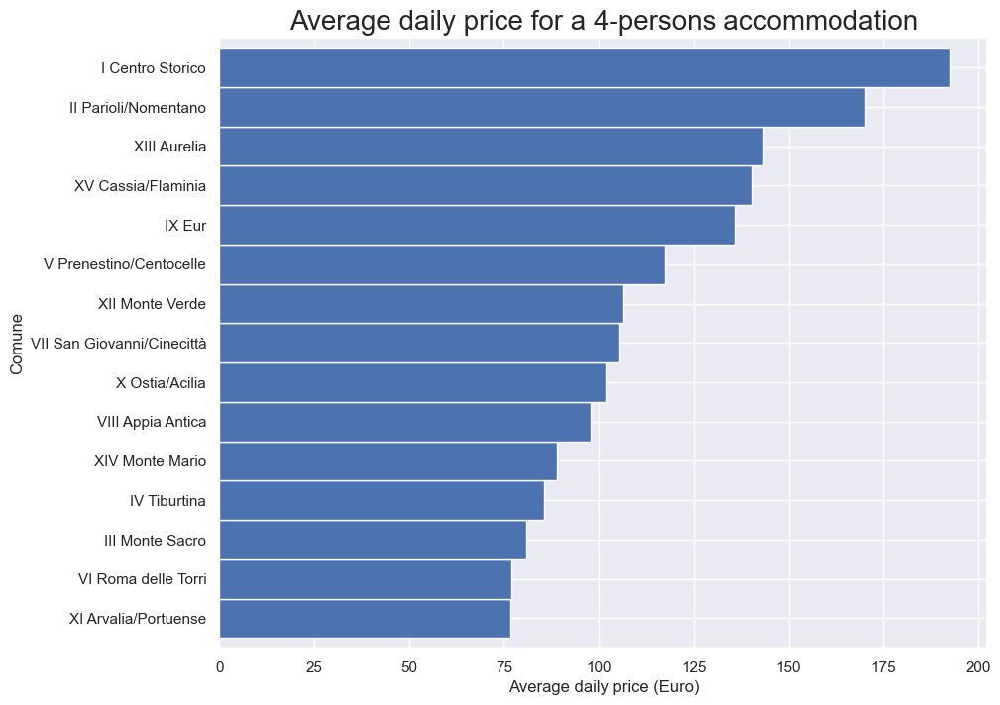

In [98]:
feq = listings[listings['accommodates']==4]
feq = feq.groupby('neighbourhood')['price'].mean().sort_values(ascending=True)
feq.plot.barh(figsize=(10, 8), color='b', width=1)
plt.title("Average daily price for a 4-persons accommodation", fontsize=20)
plt.xlabel('Average daily price (Euro)', fontsize=12)
plt.ylabel("Comune")
plt.show()

A continuación puede encontrar los barrios en un mapa. Este mapa es **interactivo**. Al pasar el cursor sobre los polígonos se muestra el nombre del municipio y el precio medio de los alojamientos para 4 personas.

In [90]:
adam = gpd.read_file("neighbourhoods.geojson")
feq = pd.DataFrame([feq])
feq = feq.transpose()
adam = pd.merge(adam, feq, on='neighbourhood', how='left')
adam.rename(columns={'price': 'average_price'}, inplace=True)
adam.average_price = adam.average_price.round(decimals=0)

map_dict = adam.set_index('neighbourhood')['average_price'].to_dict()
color_scale = LinearColormap(['yellow','red'], vmin = min(map_dict.values()), vmax = max(map_dict.values()))

def get_color(feature):
    value = map_dict.get(feature['properties']['neighbourhood'])
    return color_scale(value)

map3 = folium.Map(location=[41.89193, 12.51133], zoom_start=11)
folium.GeoJson(data=adam,
               name='Roma',
               tooltip=folium.features.GeoJsonTooltip(fields=['neighbourhood', 'average_price'],
                                                      labels=True,
                                                      sticky=False),
               style_function= lambda feature: {
                   'fillColor': get_color(feature),
                   'color': 'black',
                   'weight': 1,
                   'dashArray': '5, 5',
                   'fillOpacity':0.5
                   },
               highlight_function=lambda feature: {'weight':3, 'fillColor': get_color(feature), 'fillOpacity': 0.8}).add_to(map3)
map3

En comparación con el caso anterior hay un cambio en la distribución bastante claro. En este caso se puede apreciar que la media más alta de precios se encuentra en la zona centro de Roma. Podría verse afectada al tratarse de grupos que buscan visitar Roma y evitar el traslado entre lugares estar lo más cerca posible de los monumentos a visitar.

## 4.2 Seguridad del vecindario

Como no hay datos sobre la seguridad del vecindario en los archivos de Airbnb, en `erikastreppa.it` se pueden encontrar datos sobre las actividades ilegales en Roma. Como se puede ver, las zonas más peligrosas son en la perriferia.


<center><img src="https://erikastreppa.it/wp-content/uploads/2016/11/mappa-degrado-768x431.png" style="width: 800px;"/></center>

## 4.3 Review scores location, and location scores versus price

En esta sección, agrupamos los puntajes de revisión de la ubicación por vecindario (solo listados con al menos 10 revisiones). Aunque esperamos que la distancia al centro de la ciudad sea un factor importante, esta puntuación también debería tener en cuenta otras cosas. Otros factores pueden incluir:

* La seguridad de una ubicación.
* Ruido. Si una lista tiene una ubicación central, pero está rodeada de bares ruidosos, eso debería costar puntos en el puntaje de revisión de la ubicación.
* Si un listado está ubicado fuera del centro de la ciudad pero bien conectado por transporte público.
* Instalaciones cercanas al listado. ¿Hay supermercados, bares y restaurantes cerca?
* Cercanía de puntos de interes a visitar.
* Puede que algunas personas busquen aparcamiento gratuito si vienen en coche.

Con un primer vistazo, se aprecia que el promedio de todos los municipios están entre 4/5 con apenas variaciones entre ellos. Esto puede indicar que a la hora del hospedaje la gente no tenga que pensar mucho en la valoración y se centro en otros aspectos más importantes para ellos.

El posible cliente a la hora de elegir hospedaje se centrará en otros detalles que se acomoden más a sus gustos/necesidades que a la valoración que va ser igual. Es decir, si el posible cliente busca para 2 personas se podría centrar más en la variable del precio, como se ha visto antes, que en la valoración. Y lo mismo se podría aplicar al resto de grupos de personas. Por lo cual, la valoración podría tratarse de una información que los posibles clientes no presten mucha atención.


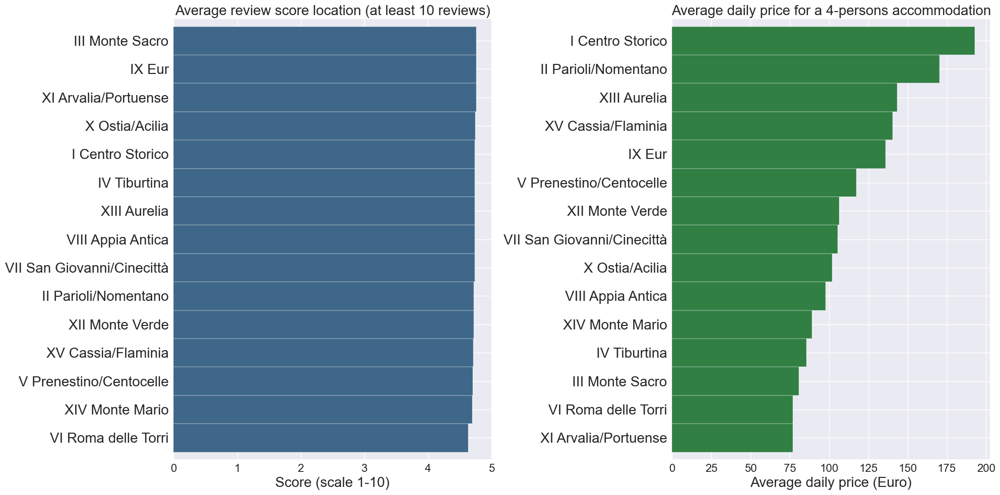

In [115]:
fig = plt.figure(figsize=(20,10))
plt.rc('xtick', labelsize=16)
plt.rc('ytick', labelsize=20)

ax1 = fig.add_subplot(121)
feq = listings[listings['number_of_reviews']>=10]
feq1 = feq.groupby('neighbourhood')['review_scores_location'].mean().sort_values(ascending=True)
ax1=feq1.plot.barh(color='#3f6789', width=1)
plt.title("Average review score location (at least 10 reviews)", fontsize=20)
plt.xlabel('Score (scale 1-10)', fontsize=20)
plt.ylabel("")

ax2 = fig.add_subplot(122)
feq = listings[listings['accommodates']==4]
feq2 = feq.groupby('neighbourhood')['price'].mean().sort_values(ascending=True)
ax2=feq2.plot.barh(color='#317f43', width=1)
plt.title("Average daily price for a 4-persons accommodation", fontsize=20)
plt.xlabel('Average daily price (Euro)', fontsize=20)
plt.ylabel("")

plt.style.use('seaborn-v0_8-dark')
plt.tight_layout()
plt.show()

## 4.4 Cómo usar las puntuaciones de las opiniones

Además de las reseñas escritas, los invitados pueden enviar una calificación de estrellas general y un conjunto de calificaciones de estrellas de categoría. Los huéspedes pueden dar calificaciones sobre:

* Experiencia general. ¿Qué tal fue la estancia?
* Limpieza. ¿El alojamineto cumplia los requisitos de limpieza y orden?
* Veracidad. ¿La página representó correctamente el espacio con las fotografías y la descripción?
* Calidad. ¿Sintió que hubo buena relación calidad/precio?
* Comunicación. ¿Qué tan bien se comunicó con su anfitrión antes y durante su estadía?
* Llegada. ¿Qué tan bien fue su registro?
* Ubicación. ¿Cómo te sentiste en el barrio?
* Servicios. ¿El alojamiento cumplió lo prometido en el anuncio?

A continuación puede ver la distribución de puntajes de todas esas categorías. ¡Lo que me llamó la atención de inmediato es que las puntuaciones parecen realmente altas en todos los ámbitos!. Está bien explicado en este artículo: [¿Más alta que la calificación promedio? El 95 % de los listados de Airbnb calificaron de 4,5 a 5 estrellas](https://mashable.com/2015/02/25/airbnb-reviews-above-average/?europe=true#1YLfzOC34sqd).

Después de haber visto las distribuciones de puntajes, personalmente consideraría que cualquier puntaje inferior de 4 no es un buen puntaje.

In [16]:
listings10 = listings[listings['number_of_reviews']>=10]

fig = make_subplots(rows=3, cols=2,subplot_titles=("Location", "Cleanliness","Value","Communication","Arrival","Accuracy"))

feq=listings10['review_scores_location'].value_counts().sort_index()
fig.add_trace(go.Scatter(x=feq.index, y=feq.values),row=1, col=1 )

feq2=listings10['review_scores_cleanliness'].value_counts().sort_index()
fig.add_trace(go.Scatter(x=feq2.index, y=feq2.values),row=1, col=2)

feq3=listings10['review_scores_location'].value_counts().sort_index()
fig.add_trace(go.Scatter(x=feq3.index, y=feq3.values),row=2, col=1 )

feq4=listings10['review_scores_cleanliness'].value_counts().sort_index()
fig.add_trace(go.Scatter(x=feq4.index, y=feq4.values),row=2, col=2)

feq5=listings10['review_scores_checkin'].value_counts().sort_index()
fig.add_trace(go.Scatter(x=feq5.index, y=feq5.values),row=3, col=1 )

feq6=listings10['review_scores_accuracy'].value_counts().sort_index()
fig.add_trace(go.Scatter(x=feq6.index, y=feq6.values),row=3, col=2)

fig.update_yaxes(title_text="number of listings", row=1, col=1)
fig.update_yaxes(title_text="number of listings", row=1, col=2)
fig.update_yaxes(title_text="number of listings", row=2, col=1)
fig.update_yaxes(title_text="number of listings", row=2, col=2)
fig.update_yaxes(title_text="number of listings", row=3, col=1)
fig.update_yaxes(title_text="number of listings", row=3, col=2)

fig.update_xaxes(title_text="Average review score", row=1, col=1)
fig.update_xaxes(title_text="Average review score", row=1, col=2)
fig.update_xaxes(title_text="Average review score", row=2, col=1)
fig.update_xaxes(title_text="Average review score", row=2, col=2)
fig.update_xaxes(title_text="Average review score", row=3, col=1)
fig.update_xaxes(title_text="Average review score", row=3, col=2)

fig.update_layout( height=700,showlegend=False)
fig.show()

## 4.5 Encontrando un buen anfitrión (Superhost)

En Airbnb esta la posiblidad para los anfintriones de obtener el estatus de "Superhost". Airbnb quiere así recompensar a los anfitriones mejor valorados y con más experiencia en Airbnb. Para más información consultar:  [Airbnb Superhost](https://www.airbnb.es/d/superhost)

* Como SuperAnfitrión, tendrá más visibilidad, potencial de ingresos y recompensas exclusivas. Es nuestra manera de decir gracias por su hospitalidad excepcional.
* Cómo convertirse en Superhost: cada 3 meses, verificamos si cumple con los siguientes criterios. Si lo haces, ganarás o mantendrás tu estatus de SuperAnfitrión.
    * Los Superanfitriones tienen una calificación general promedio de 4.8 o superior según las reseñas de al menos el 50 % de sus huéspedes de Airbnb durante el último año.
    * Los Superhosts han alojado al menos 10 estadías en el último año o, si realizan reservas a más largo plazo, 100 noches en al menos 3 estadías.
    * Los Superhosts no tienen cancelaciones en el último año, a menos que haya circunstancias atenuantes.
    * Los Superhosts responden al 90 % de los mensajes nuevos en 24 horas.

A continuación, podemos ver que solo una pequeña parte de los listados en Roma tienen un anfitrión que es Superanfitrión.

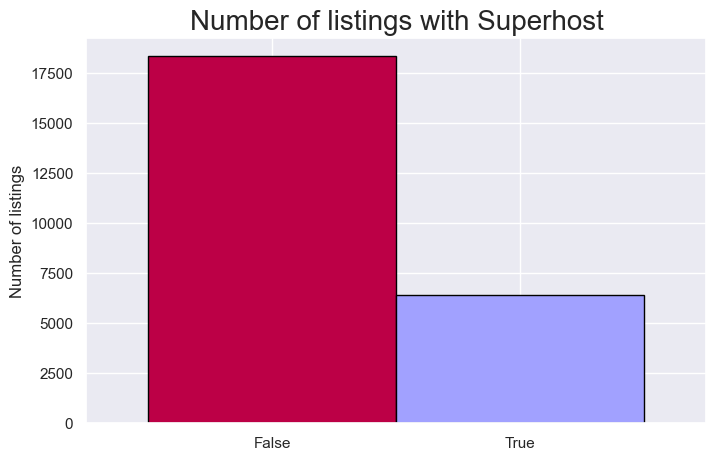

In [5]:
listings.host_is_superhost = listings.host_is_superhost.replace({"t": "True", "f": "False"})

feq=listings['host_is_superhost'].value_counts()
feq.plot.bar(figsize=(8, 5), width=1, rot=0,color=['#bc0046', '#a1a1ff'],edgecolor='black')
plt.title("Number of listings with Superhost", fontsize=20)
plt.ylabel('Number of listings', fontsize=12)
plt.show()

Ha fecha de realización, hay un total de 6419 superhost disponibles entre todos los disponibles. 

In [113]:
anl=listings10['host_response_rate'].dropna().str.strip('%').astype(int)
graph1= anl.value_counts().sort_index(ascending=False)
graph2 = listings10['host_response_time'].value_counts()

fig = make_subplots(rows=1, cols=2,subplot_titles=("Response rate (at least 10 reviews)", "Response time (at least 10 reviews)"))

fig.add_trace(go.Bar(x=graph1.index, y=graph1.values),row=1, col=1 )
fig.add_trace(go.Bar(x=graph2.index, y=graph2.values),row=1, col=2)

fig.update_yaxes(title_text="number of listings", row=1, col=1)
fig.update_yaxes(title_text="number of listings", row=1, col=2)
fig.update_xaxes(title_text="percent", row=1, col=1)
fig.update_layout( height=700)
fig.show()

## 4.6 Disponibilidad en el tiempo

El archivo de calendario contiene 365 registros para cada listado, lo que significa que para cada listado, el precio y la disponibilidad por fecha se especifican con 365 días de anticipación.

In [20]:
print(calendar.shape)

(9044349, 7)


In [3]:
calendar.price = calendar.price.str.replace(",","")
calendar['price'] = pd.to_numeric(calendar['price'].str.strip('$'))
calendar = calendar[calendar.date < '2023-09-11']

A continuación se muestra un ejemplo de los datos del calendario. Importante tener en cuenta: la disponibilidad es FALSE significa que el propietario no quiere alquilar su propiedad en la fecha específica o que la lista ya se ha reservado para esa fecha. Como queremos comparar manzanas con manzanas nuevamente con respecto a los precios en la siguiente sección, estamos fusionando la variable 'accomodate' con el calendario.

In [22]:
listings.index.name = "listing_id"
calendar = pd.merge(calendar, listings[['accommodates']], on = "listing_id", how = "left")
calendar.sample(15)

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights,accommodates
7839222,645647478742430338,2023-01-14,f,120.0,$120.00,2.0,1125.0,NaN
3816517,29046646,2023-08-25,f,55.0,$55.00,1.0,1125.0,NaN
5606926,43539479,2023-05-17,f,50.0,$50.00,1.0,1125.0,NaN
336394,3099139,2022-11-09,f,85.0,$85.00,3.0,15.0,NaN
1070405,7756457,2023-05-22,t,60.0,$60.00,2.0,1125.0,NaN
5237438,40548463,2023-04-19,f,48.0,$48.00,2.0,5.0,NaN
2620846,19382114,2022-11-03,f,199.0,$199.00,1.0,1125.0,NaN
6495490,50894201,2023-06-26,f,110.0,$110.00,1.0,90.0,NaN
3763391,28600933,2022-09-13,f,400.0,$400.00,1.0,1125.0,NaN
7391372,585392968492531599,2023-08-28,t,240.0,$216.00,5.0,1125.0,NaN


A continuación, vemos que hasta tres meses por delante, generalmente hay más alojamientos disponibles que en el futuro. Las razones de esto pueden ser que los anfitriones están actualizando más activamente sus calendarios en este período de tiempo. Este gráfico es **interactivo** y, al pasar el cursor sobre los puntos, se mostrará una información sobre herramientas con el "número de listados disponibles" y el "día de la semana" por fecha.

In [43]:
calendar['date']= pd.to_datetime(calendar['date'], format='%Y-%m-%d', errors='coerce')

A continuación, vemos que el número de alojamientos se va reduciendo progresivamente hasta llegar al pico máximo y matenerse, con excepción en las fechas de navidad donde se reducen considerablemente. A partir de ahí, el número de alojamiento apenas varia. en espera de futuras reservas pendientes de realizar.

Este gráfico es **interactivo** y, al pasar el cursor sobre los puntos, se mostrará una información sobre herramientas con el "número de listados disponibles" y el "día de la semana" por fecha.

In [ ]:
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

In [50]:
sum_available = calendar[calendar.available == "t"].groupby(['date']).size().to_frame(name= 'available').reset_index()
sum_available['weekday'] = sum_available['date'].dt.day_name()
sum_available = sum_available.set_index('date')

sum_available.iplot(y='available', mode = 'lines', xTitle = 'Date', yTitle = 'number of listings available',\
                   text='weekday', title = 'Number of listings available by date')

## 4.7 Precio medio por día

A continuación, se pueden ver las gráficas del precio promedio de todos los alojamientos para 2 personas marcados como disponibles por fecha en la primera gráfica y alojamientos para 4 personas en la segunda gráfica.

En el alojamiento para 2 personas, se alcanza el mayor pico del precio medio de 164€ entre los meses de Septiembre y Octubre, se puede apreciar un patrón cíclico en los precios respecto a los días de la semana. Al acabar Octubre hay una bajada a gran escala del precio del alojamiento que vulve a recuperar parte su valor coincidiendo con las fiestas de navidad y el fin de año, siendo el 30-31 de Diciembre su pico más alto de 140€. A partir año nuevo los precios estan en minimos, pero Marzo de 2023 empieza una subida progresiva de precios coincidiendo con las primeras reservas para el inicio de temporada de turismo. Con el paso del tiempo las reservas irán aumentando como valor del precio medio.

En el alojamiento para 4 personas, tiene un patrón diferente respecto al caso anterior. Tiene un patrón cíclico más extendido de Septiembre a Diciembre pero de menor valor de precio, llegando al máximo el 5 de Noviembre a 152€. Sin embargo, a diferencia del caso anterior, en este hay una subida de gran nivel para los días del fin de año alcanzando un pico de 180€. A partir de Enero hay un nivel de reservas constantes con ligeras variaciones para el fin de semana hasta Marzo, a la espera de futuras reservas por hacer.

Este gráfico es **interactivo** y, al pasar el cursor sobre los puntos, se mostrará una información sobre herramientas con el precio promedio y el día de la semana por fecha.

In [48]:
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

In [53]:
#group of 2 people
average_price = calendar[(calendar.available == "t") & (calendar.accommodates == 2)].groupby(['date']).mean().astype(np.int64).reset_index()
average_price['weekday'] = average_price['date'].dt.day_name()
average_price = average_price.set_index('date')

average_price.iplot(y='price', mode='lines', xTitle='Date', yTitle='Price',
    text='weekday', title='Average price of available 2 persons accommodation by date')

#group of 4 people
average_price = calendar[(calendar.available == "t") & (calendar.accommodates == 4)].groupby(['date']).mean().astype(np.int64).reset_index()
average_price['weekday'] = average_price['date'].dt.day_name()
average_price = average_price.set_index('date')

average_price.iplot(y='price', mode='lines', xTitle='Date', yTitle='Price',
    text='weekday', title='Average price of available 4 persons accommodation by date')

# 5. Minería de texto con las _reviews_ 

Veamos ahora cómo podríamos obtener algo de información extra de las opiniones de los usuarios, en términos muy elementales. Esta sección es un preliminar muy introductorio y básico de un amplio área de estudio conocida como *topic modelling*.

El archivo de "reviews" resultó no ser muy interesante, ya que solo contiene fechas de revisión para cada listado, lo que significa que solo es bueno para contar el número de revisiones. El archivo "reviews_details" contiene la misma información (y la misma cantidad de registros), con 4 columnas adicionales. Además, fusionamos host_id y host_names de la lista con el archivo reviews_details.

In [34]:
reviews.shape

(1229197, 6)

In [38]:
reviews

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,2737,24343517,2014-12-26,24333039,Raphaell,"This spot was in a great and nice area,walking..."
1,2737,24966779,2015-01-04,10493776,Ia,"Elif was really very helpful, while arranging ..."
2,2737,29770086,2015-04-12,29630601,Julia,"Elif's flat is spacious, clean, and had everyt..."
3,2737,30477570,2015-04-22,31215535,Sevil,I had a wonderful time staying with Elif and h...
4,2737,31659336,2015-05-08,1959813,Suzy,"Elif was a brilliant host, with an exceptional..."
...,...,...,...,...,...,...
1229192,706364021561816308,711373516618902584,2022-09-08,348540159,Aurelie,"Endroit très calme, beau et un accueil très ch..."
1229193,706368632054192826,711400577972053122,2022-09-08,36852987,Philipp,Die Kommunikation mit Danilo verlief reibungsl...
1229194,706549325055926003,712081657753454508,2022-09-09,261132482,Luis,Todo perfecto! Luca es muy amable y buen anfit...
1229195,706549325055926003,713601963424948343,2022-09-11,392955273,Luigi,Mi sono trovato benissimo sin da subito nell'a...


In [5]:
columns_reviews = ['host_id', 'host_name', 'name']
reviews = pd.merge(reviews, listings[columns_reviews],left_index=True, right_index=True)
reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments,host_id,host_name,name
0,2737,24343517,2014-12-26,24333039,Raphaell,"This spot was in a great and nice area,walking...",535822,Fabrizio,CASACHICA Your holiday home in Rome
1,2737,24966779,2015-01-04,10493776,Ia,"Elif was really very helpful, while arranging ...",68534156,Cristina,ISOLA DEL CUORE
2,2737,29770086,2015-04-12,29630601,Julia,"Elif's flat is spacious, clean, and had everyt...",3047,Elif,"Elif's room in cozy, clean flat."
3,2737,30477570,2015-04-22,31215535,Sevil,I had a wonderful time staying with Elif and h...,3280,Andrea,Stay a night in Calisto6 B&B Rome
4,2737,31659336,2015-05-08,1959813,Suzy,"Elif was a brilliant host, with an exceptional...",3504,Laura,Cozy apartment (2-4)with Colisseum view


A continuación, encontrará los 5 hosts con más reseñas. En el top 1 de anfitriones con más comentarios podemos encontrar al anfitrión IFlat del que hablamos con anterioridad.

In [6]:
host_reviews = reviews.groupby(['host_id', 'host_name']).size().sort_values(ascending=False).to_frame(name = "number_of_reviews")
host_reviews.head()

,,number_of_reviews
host_id,host_name,
23532561,IFlat,209
96122546,Welcome To Our Holiday Homes,141
201739458,Your.Rentals,100
63191555,Halldis,65
8973851,Stefano,58


In [7]:
reviews.comments.head()

0    This spot was in a great and nice area,walking...
1    Elif was really very helpful, while arranging ...
2    Elif's flat is spacious, clean, and had everyt...
3    I had a wonderful time staying with Elif and h...
4    Elif was a brilliant host, with an exceptional...
Name: comments, dtype: object

In [9]:
reviews.comments.values[2] #print comment with numbers and windows line break

"Elif's flat is spacious, clean, and had everything I needed for a wonderful introduction to Rome.  I did not get to meet Elif, but she was patient and responsive when I was trying to make the booking.  I met Daniele, her husband, who clearly loves Rome and was always happy to offer suggestions on where to go, what to do, or how to get there.  Excellent hosts that made me want to live in Italy!"

Añadimos ahora algo de preprocesamiento

In [7]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\nacho\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [8]:
#take out empty comments (530)
reviews_details = reviews[reviews['comments'].notnull()]

#remove numbers
reviews_details['comments'] = reviews_details['comments'].str.replace('\d+', '') 
#all to lowercase
reviews_details['comments'] = reviews_details['comments'].str.lower()
#remove windows new line
reviews_details['comments'] = reviews_details['comments'].str.replace('\r\n', "")
#remove stopwords (from nltk library)
stop_english = stopwords.words("english")
reviews_details['comments'] = reviews_details['comments'].apply(lambda x: " ".join([i for i in x.split() 
                                                      if i not in (stop_english)]))
stop_spanish = stopwords.words("spanish")
reviews_details['comments'] = reviews_details['comments'].apply(lambda x: " ".join([i for i in x.split() 
                                                      if i not in (stop_spanish)]))
# remove punctuation
reviews_details['comments'] = reviews_details['comments'].str.replace('[^\w\s]'," ")
# replace x spaces by one space
reviews_details['comments'] = reviews_details['comments'].str.replace('\s+', ' ')
# remove br
reviews_details['comments'] = reviews_details['comments'].str.replace('br', ' ')

reviews_details.comments.values[2] #print same comments again

'elif s flat spacious clean everything needed wonderful introduction rome get meet elif patient responsive trying make booking met daniele husband clearly loves rome always happy offer suggestions go do get there excellent hosts made want live italy '

Veamos cómo implementar un conteo de palabras y emplearlo para crear un *wordcloud*

In [9]:
texts = reviews_details.comments.tolist()

vec = CountVectorizer().fit(texts)
bag_of_words = vec.transform(texts)
sum_words = bag_of_words.sum(axis=0)
words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]

cvec_df = pd.DataFrame.from_records(words_freq, columns= ['words', 'counts']).sort_values(by="counts", ascending=False)
cvec_df.head(10)

,words,counts
78,apartment,14016
1,great,11921
29,rome,11348
245,us,10056
28,stay,9903
73,place,9150
69,location,8423
15,clean,5999
91,host,5882
2,nice,5860


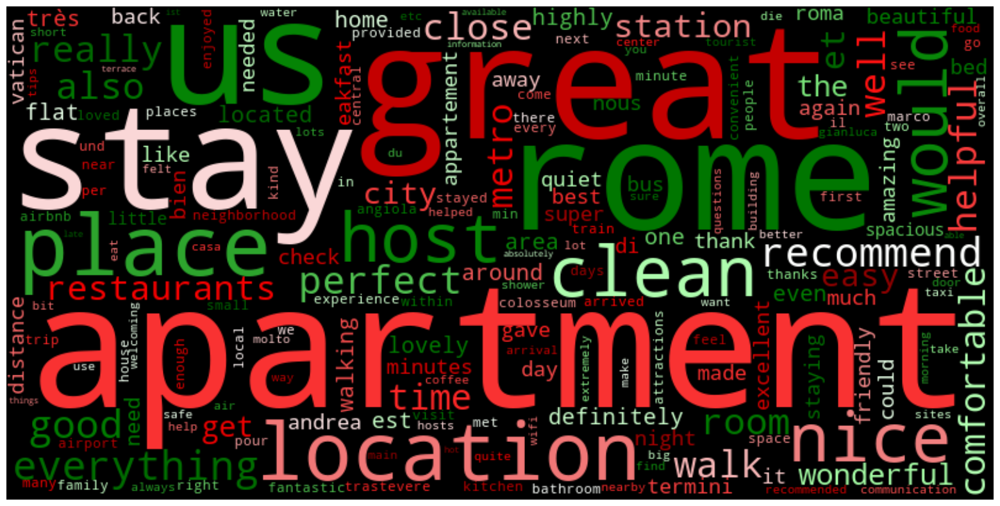

In [35]:
cvec_dict = dict(zip(cvec_df.words, cvec_df.counts))

cmap=LinearSegmentedColormap.from_list('rg',["darkred","red","lightcoral","white", "palegreen","green","darkgreen"], N=256)

wordcloud = WordCloud(width=800, height=400, colormap= cmap)
wordcloud.generate_from_frequencies(frequencies=cvec_dict)
plt.figure( figsize=(20,10) )
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

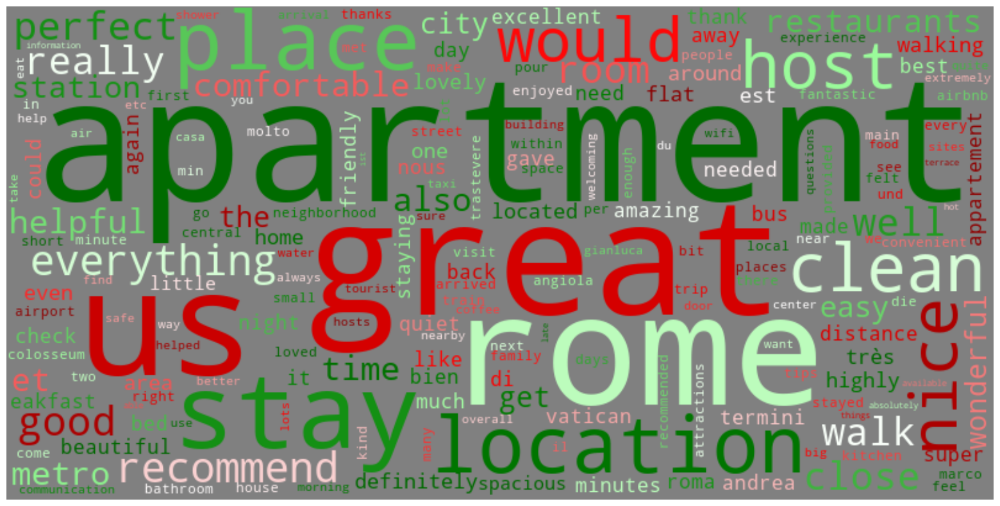

In [41]:
cvec_dict = dict(zip(cvec_df.words, cvec_df.counts))

cmap=LinearSegmentedColormap.from_list('rg',["darkred","red","lightcoral","white", "palegreen","green","darkgreen"], N=256)

wordcloud = WordCloud(width=800, height=400, colormap= cmap,background_color='#808080')
wordcloud.generate_from_frequencies(frequencies=cvec_dict)
plt.figure( figsize=(20,10) )
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()